<a href="https://colab.research.google.com/github/MarcosMota/olist_sentiment_analysis/blob/main/Reviews_de_Ecommerce_with_LSTM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# O Problema
![alt text](https://github.com/MarcosMota/AnaliseDeSentimento/blob/master/images/olist.png?raw=true)



Olist é um intermediario entre lojistas e marketplaces, ela permite o lojista gerenciar toda operação de venda de um único lugar e publicar seus produtos em grandes marketplaces, como:

- Mercado Livre
- Walmart
- Submarino
- Americanas
- Extra.com
- Casas Bahia
- Pontofrio
- Entre outros.

Com o objetivo de ajudar os lojistas melhorarem o atendimento ao cliente iremos construir uma algoritmo que nos aponte a satisfação de um cliente.


In [1]:
from argparse import Namespace

import tensorflow as tf
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences

from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix

import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

args = Namespace(
    dataset_csv = 'https://raw.githubusercontent.com/MarcosMota/AnaliseDeSentimento/master/dataset/olist_order_reviews_dataset.csv',
    train_split = 0.8,
    random_state = 42,
    vocab_size = 10000,
    embedding_dim = 16,
    max_length = 120,
    batch_size=128,
    num_epochs=5,
    early_stopping_criteria=2,
    dropout_p=0.3,
    model_storage="model_storage/lstm",
)

## Carregamento do Dataset

In [2]:
def load_data(path, column_text='review_comment_message', column_score='review_score', points_cut = [0, 2, 5], classes = [0, 1]):
  """
  Args
    path - Dataframe 
    column_text - Column text
    column_score - Random State 
    points_cut - Cut points in score
    classes - Classes
  Return
    df - Dataframe loaded 
  """
  df = pd.read_csv(path)

  df = df.dropna(subset=[column_text])

  df['label'] = pd.cut(df[column_score], bins=points_cut, labels=classes)

  df = df.rename(columns={column_text: 'text'})
  df = df[['text','label']]

  return df

In [3]:
df = load_data(args.dataset_csv)

In [4]:
import numpy as np

def split_test_train(data, split_train=0.8, random_state=200):
  """
  Args
    df - Dataframe 
    split_train - Percent of subset train 
    random_state - Random State 
  Return
    training_sentence - training subset with text
    training_label - training subset with label
    test_sentence - test subset with text
    test_label - test subset with label
  """

  df_train = data.sample(frac = split_train, random_state = random_state)
  df_test = data.drop(df_train.index)

  training_sentences = []
  training_labels = []
  testing_sentences = []
  testing_labels = []
  for index, train in df_train.iterrows():
    training_sentences.append(str(train['text']))
    training_labels.append(train['label'])
    
  for index, test in df_test.iterrows():
    testing_sentences.append(str(test['text']))
    testing_labels.append(test['label'])
  
  training_labels_final = np.array(training_labels)
  testing_labels_final = np.array(testing_labels)

  return training_sentences, training_labels, testing_sentences, testing_labels

In [5]:
training_sentences, training_labels, testing_sentences, testing_labels = split_test_train(df, split_train=args.train_split, random_state=args.random_state)

## Pré Processamento

In [6]:
oov_tok = "<OOV>"
tokenizer = Tokenizer(num_words = args.vocab_size, oov_token=oov_tok)
tokenizer.fit_on_texts(training_sentences)

def preprocess(training_sentences, testing_sentences, max_length, vocab_size, trunc_type='post', oov_tok = "<OOV>"):
  """

  Args
    training_sentences
    training_labels
    testing_sentences
    testing_labels
  Return
    training_sentences
    training_labels
    testing_sentences
    testing_labels 

  """

  training_sentences = tokenizer.texts_to_sequences(training_sentences)
  training_padded = pad_sequences(training_sentences,maxlen=max_length, truncating=trunc_type)

  testing_sequences = tokenizer.texts_to_sequences(testing_sentences)
  testing_padded = pad_sequences(testing_sequences,maxlen=max_length)
  return training_padded, testing_padded

In [7]:
training_sentences, testing_sentences = preprocess(training_sentences, testing_sentences, args.max_length, args.vocab_size)

## Modelagem

In [8]:
def create_model():
  input = tf.keras.Input(shape=(args.max_length))
  x = tf.keras.layers.Embedding(args.vocab_size, args.embedding_dim, input_length=args.max_length)(input)

  x = tf.keras.layers.LSTM(16, return_sequences=True)(x)
  x = tf.keras.layers.LSTM(16)(x)

  x = tf.keras.layers.Dropout(0.6)(x)

  x = tf.keras.layers.Dense(32, activation='relu')(x)

  output = tf.keras.layers.Dense(1, activation='sigmoid')(x)

  return tf.keras.Model(input, output)

In [9]:
earlyStoppingCallback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=args.early_stopping_criteria)

model = create_model()
model.compile(
  loss = tf.keras.losses.BinaryCrossentropy(),
  optimizer= tf.keras.optimizers.Adam(
    learning_rate=0.0001),
  metrics=['accuracy']
)

history = model.fit(
    training_sentences,
    np.array(training_labels), 
    validation_data=(testing_sentences, np.array(testing_labels)),
    epochs=15,
    batch_size=args.batch_size,
    callbacks= [earlyStoppingCallback],
)

Epoch 1/15
261/261 [==============================] - 14s 18ms/step - loss: 0.6212 - accuracy: 0.7247 - val_loss: 0.5321 - val_accuracy: 0.7219
Epoch 2/15
261/261 [==============================] - 4s 15ms/step - loss: 0.5077 - accuracy: 0.7477 - val_loss: 0.4658 - val_accuracy: 0.7873
Epoch 3/15
261/261 [==============================] - 4s 15ms/step - loss: 0.4450 - accuracy: 0.8050 - val_loss: 0.3954 - val_accuracy: 0.8188
Epoch 4/15
261/261 [==============================] - 4s 15ms/step - loss: 0.3699 - accuracy: 0.8364 - val_loss: 0.3405 - val_accuracy: 0.8450
Epoch 5/15
261/261 [==============================] - 4s 15ms/step - loss: 0.3255 - accuracy: 0.8614 - val_loss: 0.3191 - val_accuracy: 0.8586
Epoch 6/15
261/261 [==============================] - 4s 15ms/step - loss: 0.3043 - accuracy: 0.8737 - val_loss: 0.3076 - val_accuracy: 0.8665
Epoch 7/15
261/261 [==============================] - 4s 15ms/step - loss: 0.2891 - accuracy: 0.8814 - val_loss: 0.2999 - val_accuracy: 0.871

In [10]:
model.evaluate(testing_sentences, np.array(testing_labels))

261/261 [==============================] - 1s 6ms/step - loss: 0.2794 - accuracy: 0.8909


[0.2794206142425537, 0.8909112811088562]

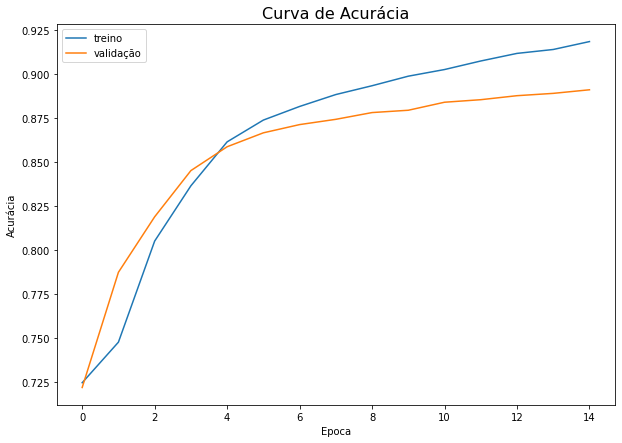

In [11]:
plt.figure(figsize = (10,7))
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Curva de Acurácia', fontsize = 16)
plt.ylabel('Acurácia')
plt.xlabel('Epoca')
plt.legend(['treino', 'validação'], loc='upper left')
plt.show()

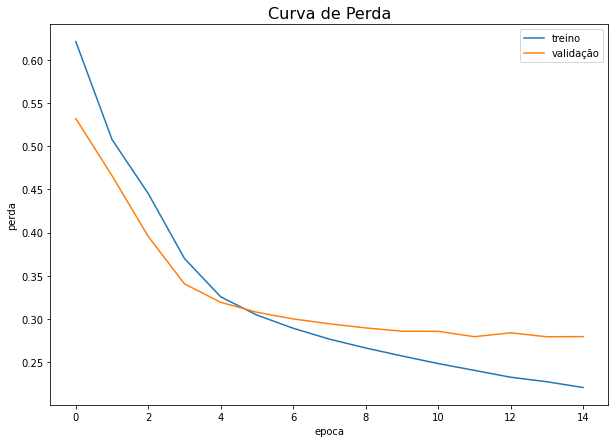

In [12]:
plt.figure(figsize = (10,7))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Curva de Perda', fontsize = 16)
plt.ylabel('perda')
plt.xlabel('epoca')
plt.legend(['treino', 'validação'], loc='upper right')
plt.show()

In [13]:

y_predicted_prob = model.predict(testing_sentences, verbose=0)
y_predicted_classes = np.where(y_predicted_prob > 0.5, 1, 0)

y_predicted_prob = y_predicted_prob[:, 0]
y_predicted_classes = y_predicted_classes[:, 0]

In [14]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix

accuracy = accuracy_score(testing_labels, y_predicted_classes)
print('Accuracy: %f' % accuracy)

precision = precision_score(testing_labels, y_predicted_classes)
print('Precision: %f' % precision)

recall = recall_score(testing_labels, y_predicted_classes)
print('Recall: %f' % recall)

f1 = f1_score(testing_labels, y_predicted_classes)
print('F1 score: %f' % f1)


Accuracy: 0.890911
Precision: 0.929940
Recall: 0.918063
F1 score: 0.923963


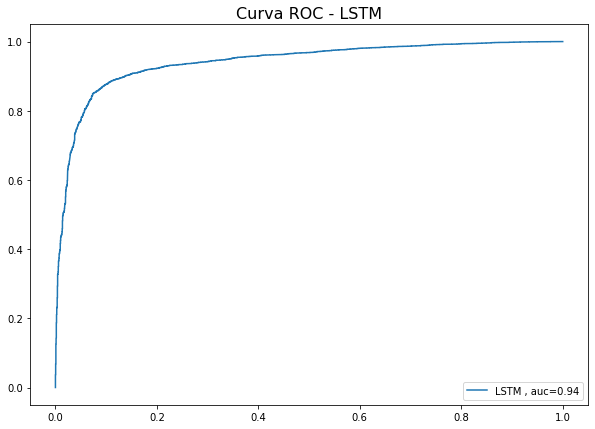

In [15]:
from sklearn.metrics import roc_curve

fpr, tpr, _ = roc_curve(testing_labels, y_predicted_prob)
auc = roc_auc_score(testing_labels, y_predicted_prob)
plt.figure(figsize = (10,7))

plt.plot(fpr,tpr,label="LSTM , auc="+str(round(auc,2)))
plt.title('Curva ROC - LSTM', fontsize = 16)
plt.legend(loc=4)
plt.show()

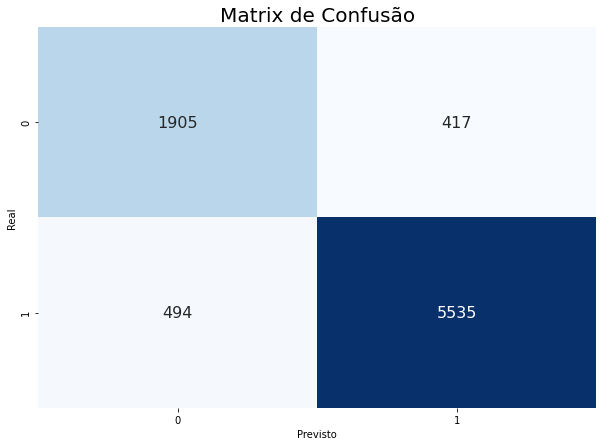

In [16]:

data = confusion_matrix(testing_labels, y_predicted_classes)
df_cm = pd.DataFrame(data, columns=np.unique(y_predicted_classes), index = np.unique(y_predicted_classes))
df_cm.index.name = 'Real'
df_cm.columns.name = 'Previsto'
plt.figure(figsize = (10,7))
plt.title('Matrix de Confusão', fontsize = 20)

sns.set(font_scale=1.4)
ax = sns.heatmap(df_cm, cbar=False, cmap="Blues", annot=True, annot_kws={"size": 16}, fmt='g')

## Salvando o modelo

In [17]:
model.save(args.model_storage)

INFO:tensorflow:Assets written to: model_storage/lstm/assets


INFO:tensorflow:Assets written to: model_storage/lstm/assets


In [19]:
teste = tokenizer.index_word

In [24]:
import os
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorboard.plugins import projector

# Set up a logs directory, so Tensorboard knows where to look for files.
log_dir='./logs/lstm-review/'
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

e = model.layers[1]
weights = e.get_weights()[0]
print(weights.shape) # shape: (vocab_size, embedding_dim)

import io

out_m = io.open(os.path.join(log_dir, 'metadata.tsv'), 'w', encoding='utf-8')
for word_num in range(1, args.vocab_size):
  word = tokenizer.index_word[word_num]
  embeddings = weights[word_num]
  out_m.write(word + "\n")
out_m.close()

# Save the weights we want to analyze as a variable. Note that the first
# value represents any unknown word, which is not in the metadata, here
# we will remove this value.
# weights = tf.Variable(model.layers[0].get_weights()[0][1:])
# Create a checkpoint from embedding, the filename and key are the
# name of the tensor.
checkpoint = tf.train.Checkpoint(embedding=tf.Variable(model.layers[1].get_weights()[0][1:]))
checkpoint.save(os.path.join(log_dir, "embedding.ckpt"))

# Set up config.
config = projector.ProjectorConfig()
embedding = config.embeddings.add()
# The name of the tensor will be suffixed by `/.ATTRIBUTES/VARIABLE_VALUE`.
embedding.tensor_name = "embedding/.ATTRIBUTES/VARIABLE_VALUE"
embedding.metadata_path = 'metadata.tsv'
projector.visualize_embeddings(log_dir, config)

(10000, 16)


In [22]:
%load_ext tensorboard


In [25]:
%tensorboard --logdir ./logs/lstm-review/


<IPython.core.display.Javascript object>